<a href="https://colab.research.google.com/github/carlosfmorenog/Document-Clustering-LDA/blob/main/Example_DocumentClusteringLDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Clustering using Latent Dirichlet Allocation (LDA) for Document Topic Identification

Credit: Mr Ifeanyi Nnaji, MSc student (RGU) supervised by Dr Mark Snaith (RGU)

In [ ]:
# First, you need to run this cell, then restart the session, and finally, don't run this cell on the second attempt!
!pip install pyLDAvis
!pip install --upgrade gensim
!pip install numpy==1.24.3

In [ ]:
# Mount the files from Carlos Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Testing that the folder works

In [ ]:
# If you want this code to work in your case, create a folder in your Google Drive called LDA
# and store the pdf documents you will find here: https://github.com/carlosfmorenog/Document-Clustering-LDA
import os

if os.path.exists('/content/drive/MyDrive/LDA/business.pdf'):
    print("This file exists in the current directory")
else:
    print("This file does not exist in the current directory")

This file exists in the current directory


## Data Loading and Preprocessing

In [ ]:
!pip install PyPDF2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 4.2 MB/s eta 0:00:00


In [ ]:
import PyPDF2

# Function to extract text from PDFs using PyPDF2
def extract_text_from_pdf(pdf_path):
    text = ""
    with open(pdf_path, 'rb') as file:
        reader = PyPDF2.PdfReader(file)
        for page in reader.pages:
            text += page.extract_text()
    return text
# Extracting text from each of the PDF files

business = extract_text_from_pdf('/content/drive/MyDrive/LDA/business.pdf')
law1 = extract_text_from_pdf('/content/drive//MyDrive/LDA/law1.pdf')
law2 = extract_text_from_pdf('/content/drive//MyDrive/LDA/law2.pdf')
law3 = extract_text_from_pdf('/content/drive//MyDrive/LDA/law3.pdf')
medical1 = extract_text_from_pdf('/content/drive//MyDrive/LDA/medical1.pdf')
medical2= extract_text_from_pdf('/content/drive//MyDrive/LDA/medical2.pdf')
politics = extract_text_from_pdf('/content/drive//MyDrive/LDA/politics.pdf')
realestate = extract_text_from_pdf('/content/drive//MyDrive/LDA/realestate.pdf')
crypto = extract_text_from_pdf('/content/drive//MyDrive/LDA/crypto.pdf')
religion1 = extract_text_from_pdf('/content/drive//MyDrive/LDA/religion1.pdf')
religion2 = extract_text_from_pdf('/content/drive//MyDrive/LDA/religion2.pdf')
it1 =extract_text_from_pdf('/content/drive//MyDrive/LDA/it1.pdf')
it2 =extract_text_from_pdf("/content/drive//MyDrive/LDA/it2.pdf")

Extracting and displaying the first 200 characters from the string variables.

In [ ]:
# Business
business[:200]

'DK LONDON\nPROJECT ART EDITORS  \nAnna Hall, Duncan Turner\nSENIOR EDITORS \nJanet Mohun, Rebecca Warren \nEDITOR  \nLizzie Munsey\nUS EDITOR \nKate Johnsen\nMANAGING ART EDITOR  \nMichelle Baxter\nMANAGING EDIT'

In [ ]:
# Law, doc1
law1[:200]

'Join an award-winning law professor for a comprehensive and accessible look  \nat the ever-evolving field of corporate law.\n“Pure intellectual stimulation that can be popped into \nthe [audio or video p'

In [ ]:
# Law, doc2
law2[:200]

' \nPlain English Campaign: The A  to Z guide  to legal phrases  \n \n \nCopyright  Plain English Campaign  \n \n \n \nThe A to Z guide to legal phrases \nThis is only a  basic guide.  If  you have any suggesti'

In [ ]:
# Law, doc3
law3[:200]

'This page intentionally left blankAn Introduction to Law\nSince the publication of its ﬁrst edition, this textbook has become the de ﬁnitive\nstudent introduction to the subject. As with earlier edition'

In [ ]:
# Medical, doc1
medical1[:200]

'Medical Terminolog y for He althc are ProfessionsMedical Terminolog y for He althc are Professions\nANDREA NELSON AND KATHERINE GREENE\nUNIVER SITY OF WEST FLORID ALIBRARIES\nPENSA COLA, FLORID AMedical '

In [ ]:
# Medical, doc2
medical2[:200]

'Encyclopedia of\nLifestyle\n  Medicine\n       &HealthEditorial Board\nGeneral Editor\nJames M. Rippe\nRippe Lifestyle Institute, Shr ewsbury , Massachusetts;\nProfessor of Biomedical Sciences, University of'

In [ ]:
# Politics
politics[:200]

'Start with FREE Cheat Sheets\nCheat Sheets include\n \x7f Checklists \x7f Charts \x7f Common Instructions \x7f And Other Good Stuff!\nGet Smart at Dummies.com \nDummies.com makes your life easier with thousands of an'

In [ ]:
# Real Estate
realestate[:200]

'GLOSSARY OF REAL ESTATE TERMS  \n \nA \nAbstract of Title  - A summary of al1 of the recorded instruments  and proceedings \nwhich affect the title to property, arranged in the  order in which they were \n'

In [ ]:
# Crypto
crypto[:200]

'Bitcoin, Blockchain, and CryptoassetsBitcoin, Blockchain, and Cryptoassets\nA Comprehensive Introduction\nFabian Schär and Aleksander Berentsen\nThe MIT Press\nCambridge, Massachusetts\nLondon, Englandc/ci'

In [ ]:
# Religion, doc1
religion1[:200]

'could not have \nbeen produced \nby anyone \nother than \nGod.” “This \nTRANSLATED  BY \nTALAL  ITANI  Quran  \xa0\n\xa0\n\xa0\xa0\xa0\nTHE\nTranslated to English by\nTALAL ITANI  \n\xa0\xa0\xa0\n\xa0\n\xa0\xa0\n \n The Quran \nTranslated to English '

In [ ]:
# Religion, doc2
religion2[:200]

'The King James Version of the\nHoly Bible\nDownloaded from www.holybooks.com\nDownloaded from www.holybooks.com - https://www.holybooks.com/download-bible/Downloaded from www.holybooks.com - https://www.'

In [ ]:
# IT, doc1
it1[:200]

' \nIT Acronyms at your \nfingertips   \nA quick references guide with over 3,000 technology \nrelated acronyms  \n  \nPage 1 of 91   \nIT Acronyms at your Fin gertips  \n \n \nWe’ve all experienced it.  You’re '

In [ ]:
# IT, doc2
it2[:200]

'\t\n\t\n\t\n\t\n\t\n\t\nDictionary\tof\tComputer\tand\tInternet\nTerms\n(Vol.\t1)\n\t\n\t\n\t\n\t\nJohn\tC.\tRigdon,\nEditor\n\tDictionary\tof\tComputer\tand\tInternet\tTerms\n\t\n\t\n\t\n\t\n\t\n1\nst\n\t\nEdition\t\t–\tAUG\t2016\t\t0/0/0/CS\n\t\nThis\tdictionar'

Now we pre-process the text to try to clean it as much as possible

In [ ]:
import re
import json
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk import pos_tag

# Download necessary NLTK resources
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger_eng') # Download the 'eng' specific tagger

# Load contractions from the JSON file
with open('/content/drive/MyDrive/LDA/contractions.json', 'r') as file:
    contractions_dict = json.load(file)

# Function to expand contractions
def expand_contractions(text, contractions_dict=contractions_dict):
    pattern = re.compile(r'\b({})\b'.format('|'.join(contractions_dict.keys())), flags=re.IGNORECASE)
    def replace(match):
        return contractions_dict.get(match.group(0).lower(), match.group(0))
    expanded_text = pattern.sub(replace, text)
    return expanded_text

# Function to remove Roman numerals
def remove_roman_numerals(text):
    roman_numeral_pattern = r'\b(I{1,3}|IV|V{1,3}|VI{0,2}|IX|X{1,3}|XI{0,2}|XIV|XV|XVI{0,2}|XVIII|XIX|XX{1,3}|XXI{0,2}|XXIV|XXV|XXVI{0,2}|XXX{0,3})\b'
    return re.sub(roman_numeral_pattern, '', text)

# Function to preprocess text
def preprocess_text(text):
    # Expand contractions
    text = expand_contractions(text)
    # Remove Roman numerals
    text = remove_roman_numerals(text)
    # Remove newline characters
    text = text.replace('\\n', ' ').replace('\n', ' ')
    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    # Remove Roman numerals
    text = remove_roman_numerals(text)
    # Expand contractions
    text = expand_contractions(text)
    # Insert spaces between concatenated words (camel case or mixed case)
    text = re.sub(r'(\w)([A-Z])', r'\1 \2', text)
    # Handle common concatenated words with underscores or other patterns
    text = re.sub(r'(\w)([a-z])([A-Z])', r'\1 \2 \3', text)
    # Standardize common misspellings and variations
    text = re.sub(r'\b(?:teh|the)\b', 'the', text)
    # Remove unwanted characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Remove extra spaces
    text = re.sub(r'\s+', ' ', text).strip()
    # Convert text to lowercase
    text = text.lower()
    # Tokenize the text
    words = word_tokenize(text)
    # Remove stop words
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]
    # Remove single and double letter words
    words = [word for word in words if len(word) > 2]
    # Ensure all words are strings
    words = [str(word) for word in words]
    # Lemmatize words
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    # POS tagging to filter only nouns and adjectives (and exclude verbs)
    pos_tags = pos_tag(words)
    words = [word for word, pos in pos_tags if pos.startswith('NN') or pos.startswith('JJ')]
    # Remove single and double letter words
    words = [word for word in words if len(word) > 2]
    # Ensure all words are strings
    words = [str(word) for word in words]
    return words


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


In [ ]:
#Further preprocessing of the extracted texts and creating a variable name that
# represent each collection of text in accordance to the dormain they belong.
business_words = preprocess_text(business)
law1_words = preprocess_text(law1)
law2_words = preprocess_text(law2)
law3_words = preprocess_text(law3)
medical1_words = preprocess_text(medical1)
medical2_words=preprocess_text(medical2)
politics_words = preprocess_text(politics)
realestate_words = preprocess_text(realestate)
crypto_words = preprocess_text(crypto)
religion1_words = preprocess_text(religion1)
religion2_words = preprocess_text(religion2)
it1_words= preprocess_text(it1)
it2_words=preprocess_text(it2)

Print the words of each document to see if the pre-processing step is promising

In [ ]:
# Words for Business
print(business_words)

['hall', 'duncan', 'turner', 'janet', 'mohun', 'rebecca', 'warren', 'lizzie', 'munsey', 'kate', 'johnsen', 'baxter', 'camilla', 'hallinan', 'sarah', 'larter', 'philip', 'ormerod', 'liz', 'wheeler', 'jonathan', 'metcalf', 'james', 'louise', 'thomas', 'ben', 'marcus', 'argyris', 'original', 'styling', 'ivy', 'roy', 'arijit', 'ganguly', 'sanjay', 'chauhan', 'mittal', 'shefali', 'upadhyay', 'anita', 'kakar', 'rupa', 'rao', 'priyaneet', 'singh', 'alka', 'thakur', 'rohan', 'sinha', 'balwant', 'singh', 'vishal', 'bhatia', 'bimlesh', 'tiwary', 'david', 'john', 'sarah', 'tomley', 'ben', 'ruocco', 'rob', 'colson', 'deirdre', 'headon', 'first', 'american', 'edition', 'united', 'state', 'publishing', 'hudson', 'new', 'york', 'new', 'york', 'sep', 'copyright', 'kindersley', 'copyright', 'part', 'publication', 'retrieval', 'system', 'form', 'mean', 'electronic', 'mechanical', 'permission', 'copyright', 'owner', 'publisher', 'book', 'great', 'britain', 'kindersley', 'catalog', 'record', 'book', 'avai

In [ ]:
# Words for Law1
print(law1_words)

['join', 'law', 'professor', 'comprehensive', 'accessible', 'look', 'field', 'corporate', 'law', 'pure', 'intellectual', 'stimulation', 'audio', 'video', 'player', 'harvard', 'magazine', 'passionate', 'erudite', 'living', 'legend', 'lecturer', 'academia', 'best', 'lecturer', 'tape', 'los', 'angeles', 'time', 'serious', 'force', 'american', 'education', 'wall', 'street', 'journal', 'george', 'geis', 'william', 'potter', 'professor', 'law', 'university', 'virginia', 'school', 'law', 'honor', 'university', 'chicago', 'professor', 'geis', 'spent', 'year', 'management', 'consultant', 'kinsey', 'company', 'client', 'corporate', 'strategy', 'many', 'issue', 'coauthor', 'digital', 'deal', 'strategy', 'partnership', 'work', 'journal', 'northwestern', 'university', 'law', 'new', 'york', 'university', 'law', 'review', 'corporate', 'headquarters', 'westfields', 'suite', 'phone', 'aprofessor', 'photo', 'jeff', 'mauritzen', 'photographcom', 'cover', 'image', 'cokadaegetty', 'image', 'course', 'compa

In [ ]:
# Words for Law2
print(law2_words)

['plain', 'english', 'campaign', 'guide', 'legal', 'phrase', 'copyright', 'english', 'campaign', 'guide', 'legal', 'phrase', 'basic', 'guide', 'suggestion', 'correction', 'improvement', 'please', 'contact', 'new', 'mill', 'high', 'peak', 'phone', 'fax', 'email', 'infoplainenglishcouk', 'website', 'copyright', 'english', 'campaign', 'copyright', 'copy', 'guide', 'disk', 'print', 'copy', 'personal', 'use', 'copy', 'permission', 'introduction', 'language', 'law', 'many', 'lawyer', 'plain', 'english', 'style', 'legal', 'phrase', 'baffle', 'nonlawyers', 'help', 'way', 'help', 'nonlawyers', 'legal', 'phrase', 'lawyer', 'idea', 'leg', 'phrase', 'use', 'explanation', 'guide', 'alternative', 'hope', 'explanation', 'prompt', 'lawye', 'sure', 'use', 'legal', 'jargon', 'necessary', 'word', 'explain', 'idea', 'concept', 'give', 'strict', 'legal', 'defin', 'itions', 'term', 'explanation', 'law', 'wale', 'much', 'work', 'progress', 'ome', 'correction', 'clarification', 'addition', 'please', 'email', 

In [ ]:
# Words for Law3
print(law3_words)

['page', 'blank', 'introduction', 'law', 'publication', 'edition', 'textbook', 'nitive', 'student', 'introduction', 'subject', 'edition', 'seventh', 'editiongives', 'clear', 'understanding', 'fundamental', 'legal', 'concept', 'importancewithin', 'society', 'addition', 'book', 'address', 'way', 'rule', 'law', 'respond', 'impact', 'change', 'economic', 'andpolitical', 'life', 'title', 'updated', 'explores', 'recent', 'highprole', 'development', 'civil', 'partnership', 'act', 'racial', 'religious', 'bill', 'introductory', 'text', 'cover', 'wide', 'range', 'topic', 'ina', 'clear', 'sensible', 'fashion', 'full', 'context', 'reason', 'introduction', 'law', 'ideal', 'student', 'law', 'undergraduate', 'law', 'student', 'law', 'part', 'mixed', 'degree', 'student', 'socialsciences', 'course', 'law', 'option', 'legal', 'education', 'universitythe', 'law', 'context', 'series', 'editor', 'university', 'college', 'london', 'christopher', 'crudden', 'lincoln', 'college', 'oxford', 'law', 'context', '

In [ ]:
# Words for Medical1
print(medical1_words)

['medical', 'terminolog', 'althc', 'profession', 'medical', 'terminolog', 'althc', 'profession', 'medical', 'erminology', 'ealthcar', 'profession', 'ndrea', 'elson', 'atherine', 'eene', 'creative', 'common', 'attribution', 'international', 'icense', 'wher', 'otherwise', 'notedcontents', 'introduc', 'tion', 'ackno', 'part', 'imain', 'body', 'word', 'part', 'rule', 'prefix', 'body', 'terminolog', 'sensor', 'system', 'integumen', 'tary', 'system', 'skeletal', 'ystem', 'muscular', 'ystem', 'nervous', 'ystem', 'cardiovascular', 'ystem', 'blood', 'essels', 'lympha', 'tic', 'mmune', 'ystems', 'atory', 'system', 'digestiv', 'system', 'endocrine', 'ystem', 'urinar', 'system', 'male', 'tive', 'system', 'female', 'tive', 'system', 'obste', 'trics', 'glossar', 'introduction', 'welcome', 'medical', 'erminology', 'healthcar', 'profession', 'medical', 'terminolog', 'languag', 'tha', 'use', 'edical', 'term', 'eek', 'atin', 'ord', 'par', 'yms', 'modernda', 'languag', 'term', 'languag', 'unting', 'task'

In [ ]:
# Words for Medical2
print(medical2_words)

['encyclopedia', 'lifestyle', 'medicine', 'health', 'editorial', 'board', 'general', 'editor', 'james', 'rippe', 'lifestyle', 'institute', 'shr', 'ewsbury', 'massachusetts', 'professor', 'biomedical', 'science', 'university', 'central', 'florida', 'associate', 'ofessor', 'medicine', 'car', 'diology', 'ufts', 'university', 'medical', 'school', 'associate', 'editor', 'mary', 'abbott', 'waite', 'rippe', 'lifestyle', 'institute', 'editorial', 'board', 'johanna', 'national', 'institute', 'health', 'charles', 'memorial', 'hospital', 'rhode', 'island', 'john', 'foreyt', 'baylor', 'college', 'medicine', 'manson', 'harvar', 'medical', 'school', 'thomas', 'rowland', 'medical', 'center', 'childr', 'hospital', 'advisory', 'board', 'henry', 'black', 'rush', 'university', 'medical', 'center', 'david', 'center', 'disease', 'contr', 'evention', 'samuel', 'crockett', 'florida', 'hospital', 'diabetes', 'ronald', 'bellis', 'college', 'pharmacy', 'ermont', 'karen', 'university', 'central', 'florida', 'lar

In [ ]:
# Words for Politics
print(politics_words)

['start', 'cheat', 'sheet', 'cheat', 'sheet', 'checklist', 'chart', 'common', 'instruction', 'good', 'stuff', 'smart', 'dummiescom', 'dummiescom', 'life', 'easier', 'answer', 'everything', 'wallpaper', 'latest', 'version', 'window', 'check', 'video', 'article', 'stepbystep', 'instruction', 'weekly', 'dose', 'dummy', 'sign', 'newsletter', 'digital', 'photography', 'microsoft', 'window', 'office', 'personal', 'finance', 'health', 'wellness', 'pod', 'phone', 'bay', 'internet', 'food', 'home', 'garden', 'dummiescom', 'get', 'dummiescom', 'access', 'cheat', 'sheet', 'book', 'british', 'politics', 'umm', 'ffirsindd', 'iffirsindd', 'mffirsindd', 'iiffirsindd', 'mby', 'julian', 'knight', 'british', 'politics', 'umm', 'john', 'wiley', 'son', 'ltd', 'publication', 'ffirsindd', 'iiiffirsindd', 'iii', 'mbritish', 'politics', 'john', 'wiley', 'son', 'atrium', 'southern', 'gate', 'chichester', 'west', 'sussex', 'england', 'email', 'order', 'customer', 'service', 'csbookswileycouk', 'visit', 'home', 

In [ ]:
# Words for Real Estate
print(realestate_words)

['abstract', 'title', 'summary', 'instrument', 'affect', 'title', 'property', 'order', 'accretion', 'addition', 'land', 'process', 'nature', 'water', 'wind', 'interest', 'accrue', 'grow', 'accrued', 'interest', 'interest', 'due', 'payable', 'acknowledgm', 'ent', 'formal', 'declaration', 'authorized', 'officer', 'person', 'execute', 'instrument', 'execution', 'person', 'act', 'deed', 'acquisition', 'act', 'process', 'person', 'property', 'acre', 'measure', 'land', 'square', 'foot', 'action', 'specific', 'performance', 'court', 'action', 'compel', 'principal', 'comply', 'provision', 'contract', 'adjacent', 'actual', 'contact', 'contiguous', 'tual', 'contact', 'administrator', 'person', 'court', 'administer', 'estate', 'person', 'died', 'intestate', 'valorem', 'valuation', 'adverse', 'possession', 'mean', 'title', 'occupant', 'actual', 'open', 'notorious', 'exclusive', 'continuous', 'occupancy', 'operty', 'claim', 'required', 'statutory', 'period', 'affidavit', 'statement', 'declaration',

In [ ]:
# Words for Crypto
print(crypto_words)

['bitcoin', 'blockchain', 'cryptoassets', 'blockchain', 'cryptoassets', 'comprehensive', 'introduction', 'fabian', 'schr', 'aleksander', 'berentsen', 'press', 'cambridge', 'massachusetts', 'london', 'massachusetts', 'institute', 'technology', 'part', 'book', 'form', 'electronic', 'mechanical', 'mean', 'information', 'storage', 'retrieval', 'permission', 'publisher', 'book', 'stone', 'serif', 'stone', 'westchester', 'service', 'book', 'german', 'bitcoin', 'blockchain', 'und', 'kryptoassets', 'umfassende', 'einfhrung', 'library', 'congress', 'cataloginginpublication', 'data', 'name', 'schr', 'fabian', 'author', 'berentsen', 'aleksander', 'author', 'title', 'bitcoin', 'blockchain', 'cryptoassets', 'comprehensive', 'introduction', 'fabian', 'schr', 'aleksander', 'berentsen', 'description', 'cambridge', 'massachusetts', 'press', 'bibliographical', 'reference', 'index', 'identiers', 'subject', 'bitcoin', 'cryptocurrencies', 'database', 'classication', 'record', 'available', 'lccnloc', 'gov',

In [ ]:
# Words for Religion1
print(religion1_words)

['anyone', 'god', 'quran', 'english', 'quran', 'english', 'talal', 'itani', 'clear', 'quran', 'dallas', 'copyright', 'talal', 'itani', 'part', 'book', 'form', 'electronic', 'mechanical', 'mean', 'information', 'storage', 'retrieval', 'system', 'permission', 'author', 'reviewer', 'brief', 'passage', 'review', 'usa', 'november', 'contact', 'author', 'phone', 'email', 'talalclear', 'qurancom', 'quran', 'quran', 'seek', 'refuge', 'god', 'outcast', 'authority', 'trust', 'lord', 'authority', 'associate', 'others', 'translator', 'talal', 'itani', 'electronics', 'quran', 'order', 'discredit', 'talal', 'quran', 'others', 'translate', 'quran', 'hope', 'english', 'translation', 'time', 'accurate', 'easy', 'read', 'word', 'translator', 'reminder', 'contains', 'heal', 'doubt', 'fro', 'lord', 'world', 'alfatihah', 'albaqarah', 'ali', 'imran', 'annisa', 'almaidah', 'alanam', 'alaraf', 'alanfal', 'hud', 'yusuf', 'arrad', 'ibrahim', 'alhijr', 'nnahl', 'alisra', 'alkahf', 'maryam', 'taha', 'alanbiya', '

In [ ]:
# Words for Religion2
print(religion2_words)

['james', 'version', 'holy', 'bible', 'downloaded', 'content', 'preface', 'version', 'preface', 'translation', 'old', 'testament', 'genesis', 'exodus', 'leviticus', 'number', 'deuteronomy', 'joshua', 'judge', 'ruth', 'samuel', 'samuel', 'chronicle', 'chronicle', 'ezra', 'job', 'psalm', 'proverb', 'song', 'isaiah', 'jeremiah', 'lamentation', 'daniel', 'hosea', 'joel', 'amos', 'obadiah', 'jonah', 'micah', 'nahum', 'habakkuk', 'zephaniah', 'haggai', 'zechariah', 'new', 'testament', 'matthew', 'mark', 'luke', 'john', 'act', 'roman', 'corinthian', 'corinthian', 'galatian', 'ephesian', 'philippian', 'colossian', 'thessalonian', 'thessalonian', 'timothy', 'timothy', 'titus', 'philemon', 'james', 'john', 'john', 'john', 'jude', 'revelation', 'version', 'preface', 'version', 'james', 'bible', 'original', 'publish', 'date', 'march', 'january', 'text', 'king', 'james', 'version', 'holy', 'bible', 'authorized', 'version', 'public', 'domain', 'portable', 'document', 'format', 'version', 'james', 'b

In [ ]:
# Words for IT1
print(it1_words)

['acronym', 'fingertip', 'quick', 'reference', 'guide', 'technology', 'acronym', 'page', 'acronym', 'fin', 'gertips', 'experienced', 'youre', 'someone', 'spout', 'table', 'mean', 'help', 'list', 'acronym', 'quick', 'reference', 'list', 'top', 'acronym', 'need', 'top', 'acronym', 'click', 'link', 'full', 'definition', 'application', 'programmer', 'interface', 'amazon', 'web', 'service', 'cloud', 'bring', 'network', 'identity', 'bring', 'encryption', 'internet', 'thing', 'mobile', 'device', 'management', 'payment', 'card', 'industry', 'data', 'security', 'standard', 'saa', 'software', 'service', 'software', 'network', 'service', 'level', 'agreement', 'virtual', 'desktop', 'infrastructure', 'virtual', 'machine', 'quick', 'reference', 'acronym', 'click', 'link', 'full', 'definition', 'acronym', 'acronym', 'gigabit', 'ethernet', 'gigabit', 'ethernet', 'busy', 'period', 'high', 'day', 'busy', 'period', 'onetoone', 'single', 'carrier', 'radio', 'transmission', 'technology', 'twodimensional', 

In [ ]:
# Words for IT2
print(it2_words)

['dictionary', 'computer', 'internet', 'term', 'vol', 'john', 'rigdon', 'editor', 'dictionary', 'computer', 'internet', 'term', 'edition', 'dictionary', 'microsoft', 'language', 'portal', 'addition', 'john', 'rigdon', 'eastern', 'digital', 'resource', 'right', 'part', 'book', 'mean', 'express', 'consent', 'copyright', 'holder', 'entry', 'microsoft', 'language', 'portal', 'microsoft', 'corporation', 'distribution', 'release', 'microsoft', 'see', 'eastern', 'digital', 'resource', 'bramblewood', 'cartersville', 'saleswordsrusinfo', 'tel', 'overview', 'dictionary', 'contains', 'term', 'specific', 'computer', 'internet', 'term', 'definition', 'description', 'page', 'dictionary', 'comprehensive', 'resource', 'available', 'term', 'relate', 'application', 'command', 'function', 'system', 'image', 'networking', 'dictionary', 'term', 'breadth', 'everyone', 'novice', 'basic', 'information', 'mainframe', 'system', 'programmer', 'professional', 'sophisticated', 'hardtofind', 'information', 'thats',

Combine similar documents to a single variable.

In [ ]:
# Law
law_words=law1_words+law2_words + law3_words
print(law_words[:10])

['join', 'law', 'professor', 'comprehensive', 'accessible', 'look', 'field', 'corporate', 'law', 'pure']


In [ ]:
# Medical
medical_words=medical1_words+medical2_words
print(medical_words[:10])

['medical', 'terminolog', 'althc', 'profession', 'medical', 'terminolog', 'althc', 'profession', 'medical', 'erminology']


In [ ]:
# IT
it_words=it1_words+it2_words
print(it_words[:10])

['acronym', 'fingertip', 'quick', 'reference', 'guide', 'technology', 'acronym', 'page', 'acronym', 'fin']


In [ ]:
# Religion
religion_words=(religion1_words + religion2_words)
print(religion_words[:10])

['anyone', 'god', 'quran', 'english', 'quran', 'english', 'talal', 'itani', 'clear', 'quran']


Printing the length of several lists of words related to in the domains/documents.

In [ ]:
print("Total number of words listed in business documents:",len(business_words))
print("Total number of words listed in medical documents:",len(medical_words))
print("Total number of words listed in the law documents:",len(law_words))
print("Total number of words listed in the politics documents:",len(politics_words))
print("Total number of words listed in the real estate documents:",len(realestate_words))
print("Total number of words listed in the crypto documents:",len(crypto_words))
print("Total number of words listed in the religious documents:",len(religion_words))
print("Total number of words listed in the IT documents:",len(it_words))

Total number of words listed in business documents: 52261
Total number of words listed in medical documents: 424865
Total number of words listed in the law documents: 118243
Total number of words listed in the politics documents: 58724
Total number of words listed in the real estate documents: 2631
Total number of words listed in the crypto documents: 37373
Total number of words listed in the religious documents: 273062
Total number of words listed in the IT documents: 322788


In [ ]:
# Saving cleaned words into a csv file
import csv

# Lists of words and corresponding filenames
word_list = [
    (medical_words, '/content/drive/MyDrive/LDA/medical_words.csv'),
    (politics_words, '/content/drive/MyDrive/LDA/politics_words.csv'),
    (religion_words, '/content/drive/MyDrive/LDA/religion_words.csv'),
    (crypto_words, '/content/drive/MyDrive/LDA/crypto_words.csv'),
    (business_words, '/content/drive/MyDrive/LDA/business_words.csv'),
    (law_words, '/content/drive/MyDrive/LDA/law_words.csv'),
    (realestate_words, '/content/drive/MyDrive/LDA/realestate_words.csv'),
    (it_words, '/content/drive/MyDrive/LDA/it_words.csv')
]

# Save each list to a CSV file
for words, filename in word_list:
    with open(filename, 'w', newline='') as file: csv.writer(file).writerows([[word] for word in words])

### Checkpoint 1: Load document csv files

In [ ]:
# Load file from csv
#import csv

#def load_csv_as(file_path):
#  try:
#    with open(file_path, 'r', encoding='utf-8') as file:
#      reader = csv.reader(file)
#      data=[]
#      for row in reader:
#        for item in row:
#            data.append(item)
#      return data
#  except FileNotFoundError:
#    print(f"Error: File not found at {file_path}")
#    return []
#  except Exception as e:
#    print(f"An error occurred: {e}")
#    return []

# Load:
#file_path = '/content/drive/MyDrive/LDA/medical_words.csv'
#medical_words = load_csv_as(file_path)
#file_path = '/content/drive/MyDrive/LDA/politics_words.csv'
#politics_words = load_csv_as(file_path)
#file_path = '/content/drive/MyDrive/LDA/religion_words.csv'
#religion_words = load_csv_as(file_path)
#file_path = '/content/drive/MyDrive/LDA/business_words.csv'
#business_words = load_csv_as(file_path)
#file_path = '/content/drive/MyDrive/LDA/it_words.csv'
#it_words = load_csv_as(file_path)
#file_path = '/content/drive/MyDrive/LDA/law_words.csv'
#law_words = load_csv_as(file_path)
#file_path = '/content/drive/MyDrive/LDA/crypto_words.csv'
#crypto_words = load_csv_as(file_path)
#file_path = '/content/drive/MyDrive/LDA/realstate_words.csv'
#realstate_words = load_csv_as(file_path)

## Data Exploration

Exploring basic statistic


In [ ]:
import pandas as pd

# Craeting a function that calculate basic statistics
def basic_statistics(words, category):
    num_words = len(words)
    num_unique_words = len(set(words))
    return pd.DataFrame({
        'Category': [category],
        'Total Words': [num_words],
        'Unique Words': [num_unique_words]
    })

# Calculating statistics for each category
business_stats = basic_statistics(business_words, 'Business')
law_stats = basic_statistics(law_words, 'Law')
medical_stats = basic_statistics(medical_words, 'Medical')
politics_stats = basic_statistics(politics_words, 'Politics')
crypto_stats = basic_statistics(crypto_words, 'Crypto')
religion_stats = basic_statistics(religion_words, 'Religion')
realestate_stats = basic_statistics(realestate_words, 'Real Estate')
it_stats = basic_statistics(it_words, 'IT')


# Concatenating all statistics into one DataFrame
all_stats = pd.concat([business_stats, law_stats, medical_stats, politics_stats,
                       crypto_stats, religion_stats, realestate_stats, it_stats], ignore_index=True)

# Displaying the statistics
print(all_stats)

      Category  Total Words  Unique Words
0     Business        52261          6599
1          Law       118243         15030
2      Medical       424865         31150
3     Politics        58724          5829
4       Crypto        37373          5636
5     Religion       273062         13154
6  Real Estate         2631           973
7           IT       322788         11876


Evaluating word frequency distributions across topics

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# Creating aFunction to plot word frequency distributions
def plot_word_frequency(words, category):
    # Count word frequencies
    word_counts = Counter(words)
    # Create a DataFrame from the word frequencies
    word_freq_df = pd.DataFrame(word_counts.items(), columns=['Word', 'Frequency'])
    # Sort the DataFrame by frequency
    word_freq_df = word_freq_df.sort_values(by='Frequency', ascending=False).head(15)

    # Plotting the word frequency distribution
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Frequency', y='Word', data=word_freq_df, palette='viridis')
    plt.title(f'The Frequency Distribution for top 15 words associated with {category}')
    plt.xlabel('Frequency')
    plt.ylabel('Word')
    plt.show()

/tmp/ipython-input-42-317694284.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='Word', data=word_freq_df, palette='viridis')


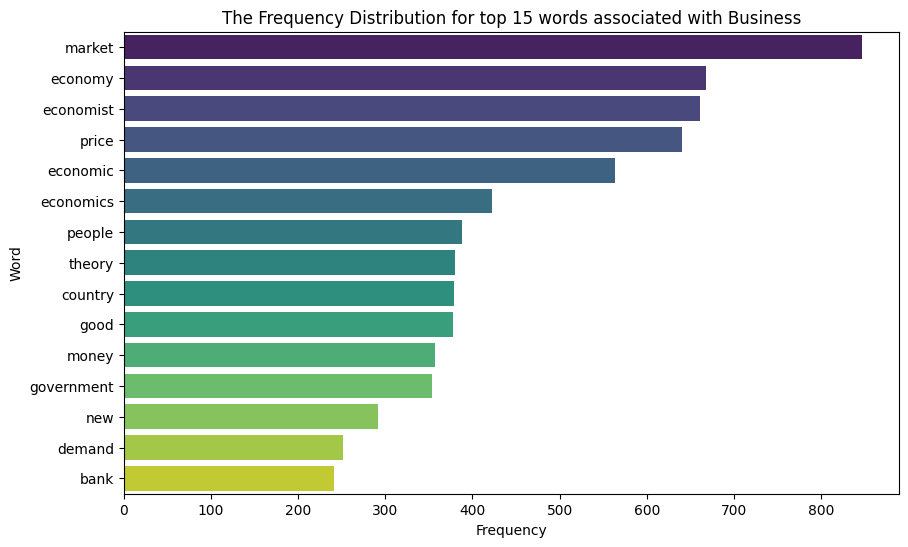

/tmp/ipython-input-42-317694284.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='Word', data=word_freq_df, palette='viridis')


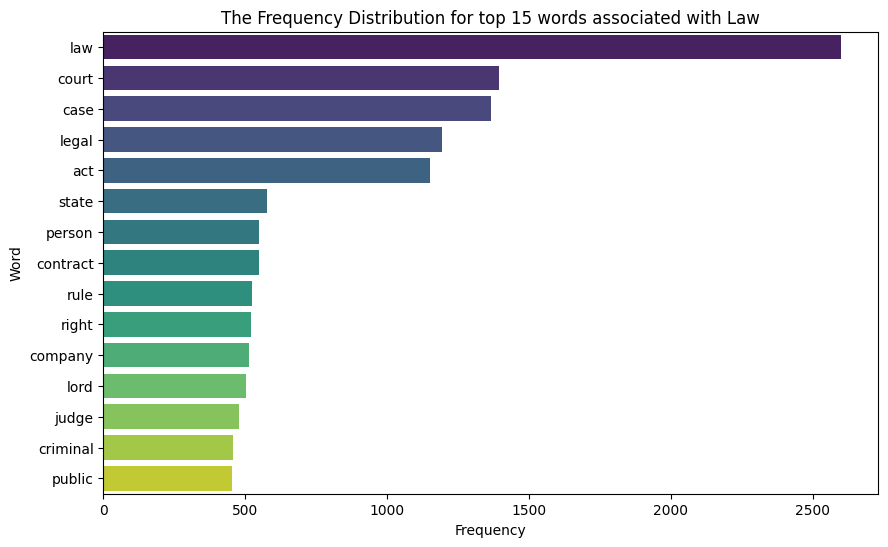

/tmp/ipython-input-42-317694284.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='Word', data=word_freq_df, palette='viridis')


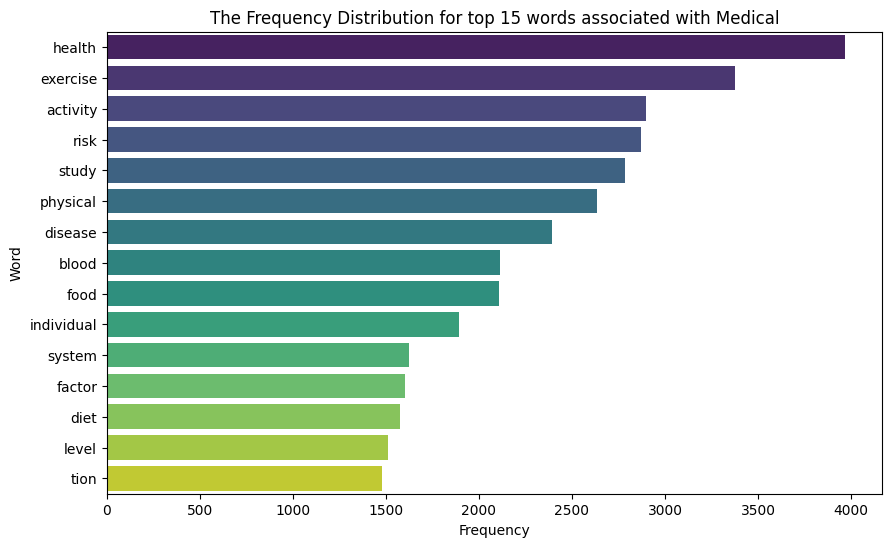

/tmp/ipython-input-42-317694284.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='Word', data=word_freq_df, palette='viridis')


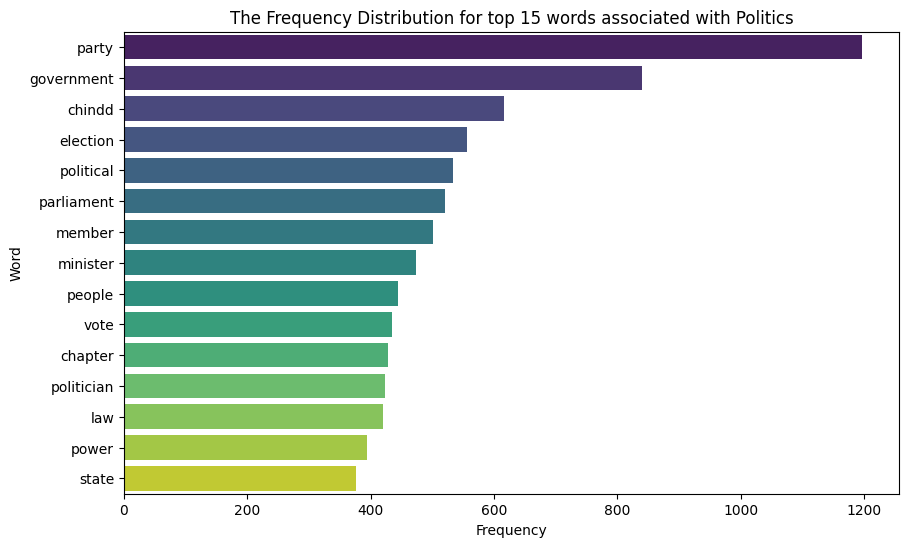

/tmp/ipython-input-42-317694284.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='Word', data=word_freq_df, palette='viridis')


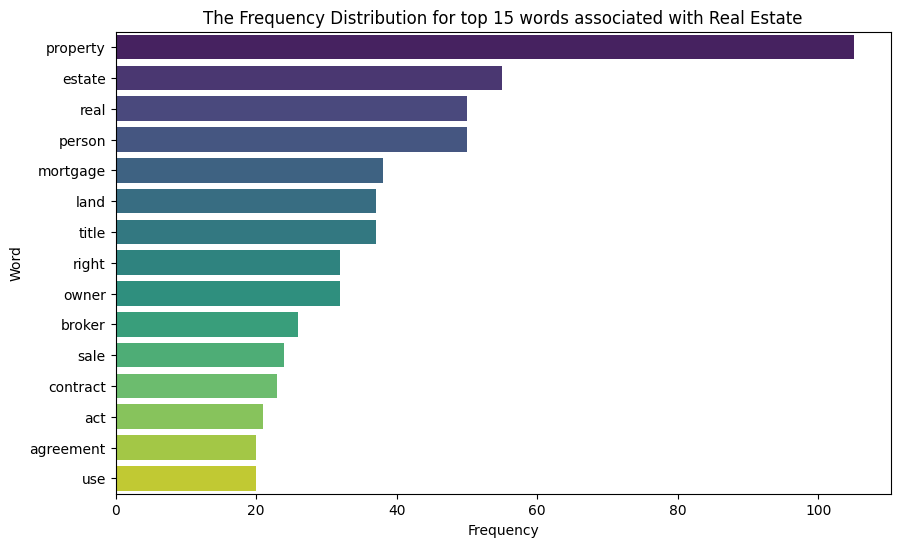

/tmp/ipython-input-42-317694284.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='Word', data=word_freq_df, palette='viridis')


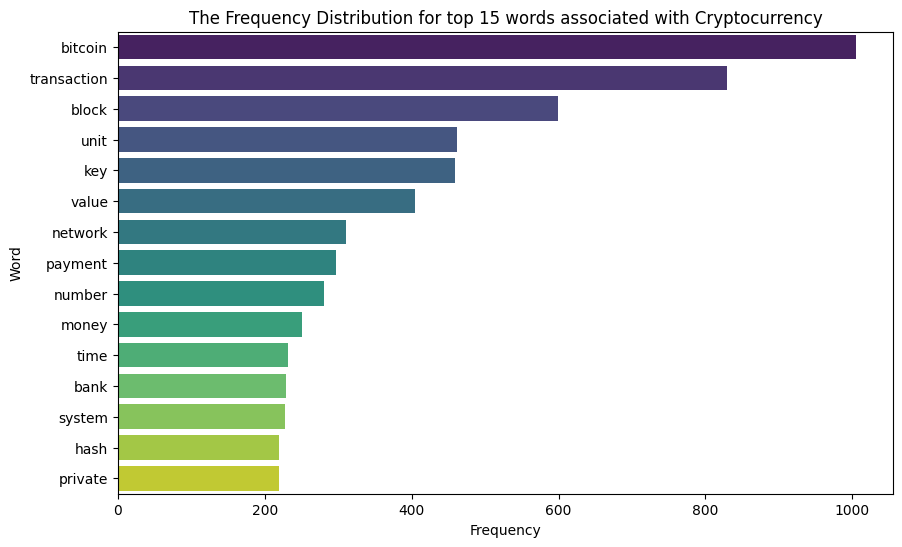

/tmp/ipython-input-42-317694284.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='Word', data=word_freq_df, palette='viridis')


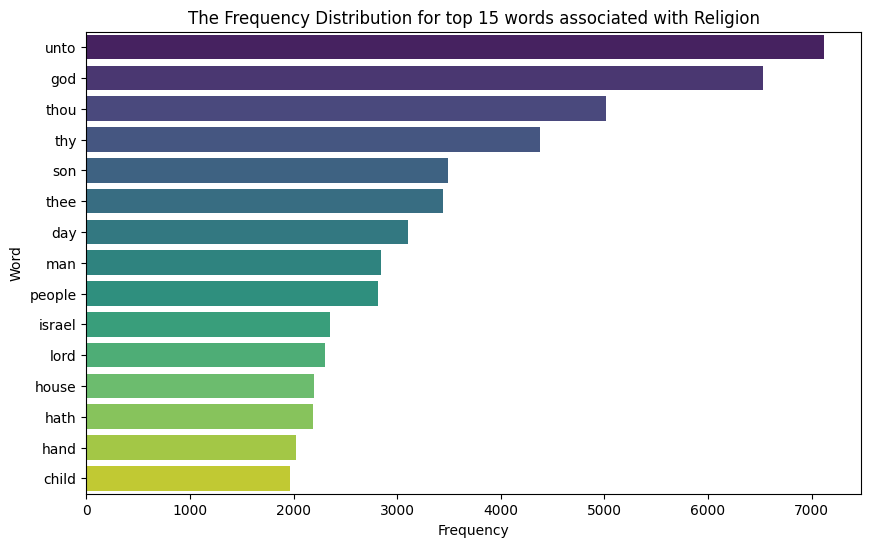

/tmp/ipython-input-42-317694284.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='Word', data=word_freq_df, palette='viridis')


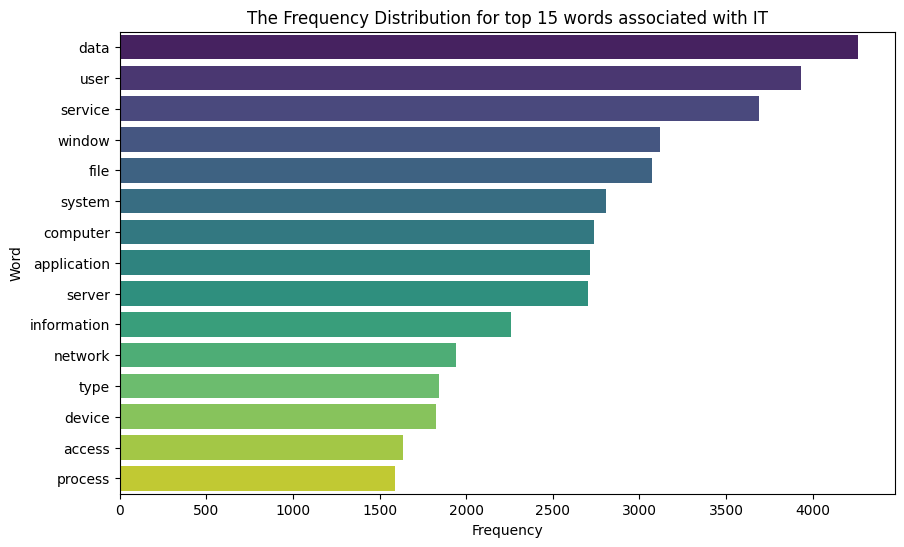

In [ ]:
# Plot Business
plot_word_frequency(business_words, 'Business')
# Plot Law
plot_word_frequency(law_words, 'Law')
# Plot Medical
plot_word_frequency(medical_words, 'Medical')
# Plot Politics
plot_word_frequency(politics_words, 'Politics')
# Plot Real Estate
plot_word_frequency(realestate_words, 'Real Estate')
# Plot Crypto
plot_word_frequency(crypto_words, 'Cryptocurrency')
# Plot Religion
plot_word_frequency(religion_words, 'Religion')
# Plot IT
plot_word_frequency(it_words, 'IT')

Calculating the word length distribution on text available in each documents

In [ ]:
## Evaluating the Word Length Distributions
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Function to calculate word lengths and plot their distributions
def plot_word_length_distribution(words, category):
    # Calculate the length of each word
    word_lengths = [len(word) for word in words]

    # Create a DataFrame from the word lengths
    word_length_df = pd.DataFrame(word_lengths, columns=['Word Length'])

    # Plotting the word length distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(word_length_df['Word Length'], bins=5, binwidth=5, kde=True, color='purple')
    plt.title(f'Word Length Distribution in {category}')
    plt.xlim(0, 25)
    plt.xlabel('Word Length')
    plt.ylabel('Frequency')
    plt.show()

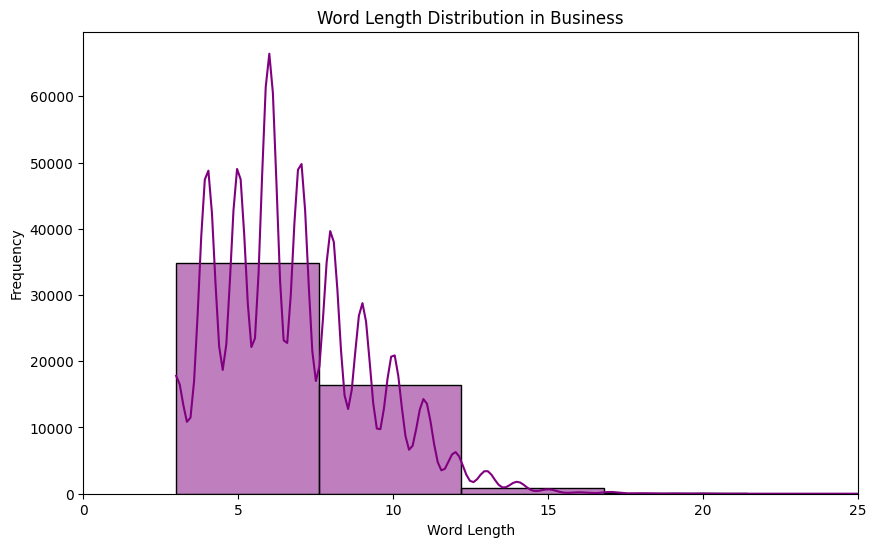

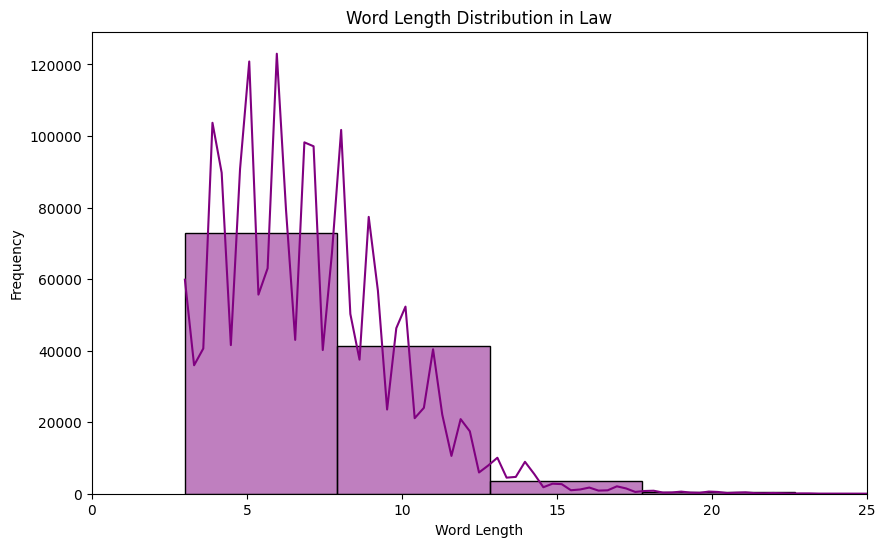

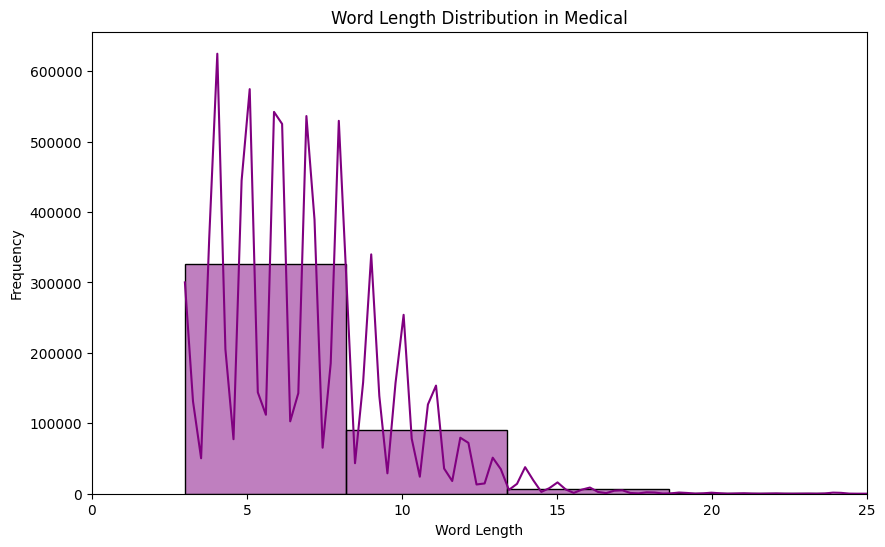

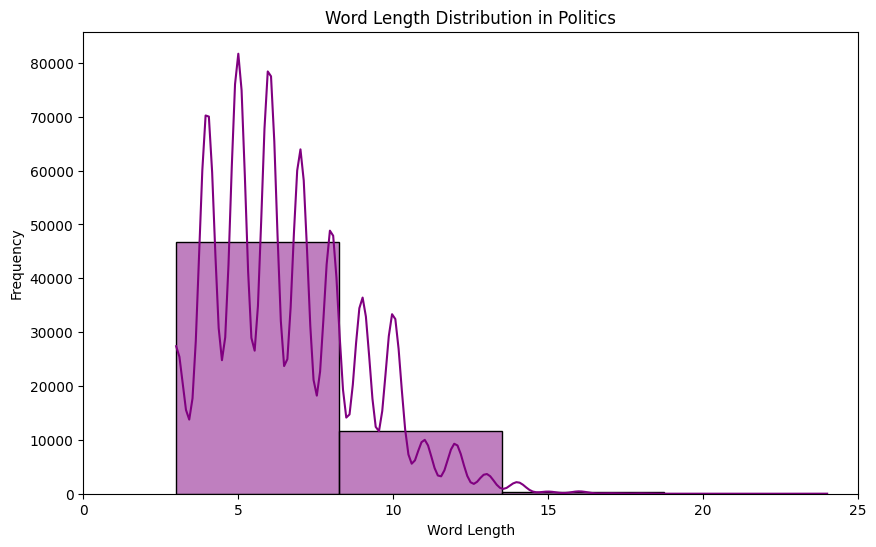

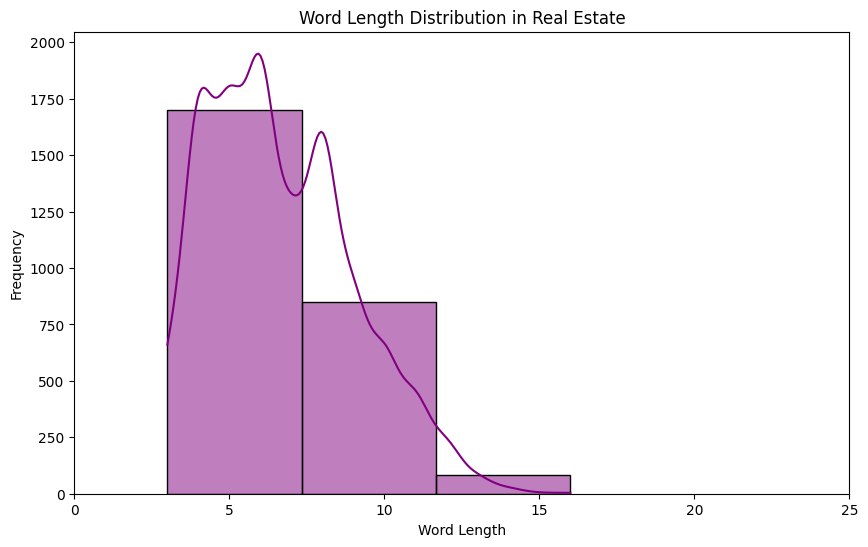

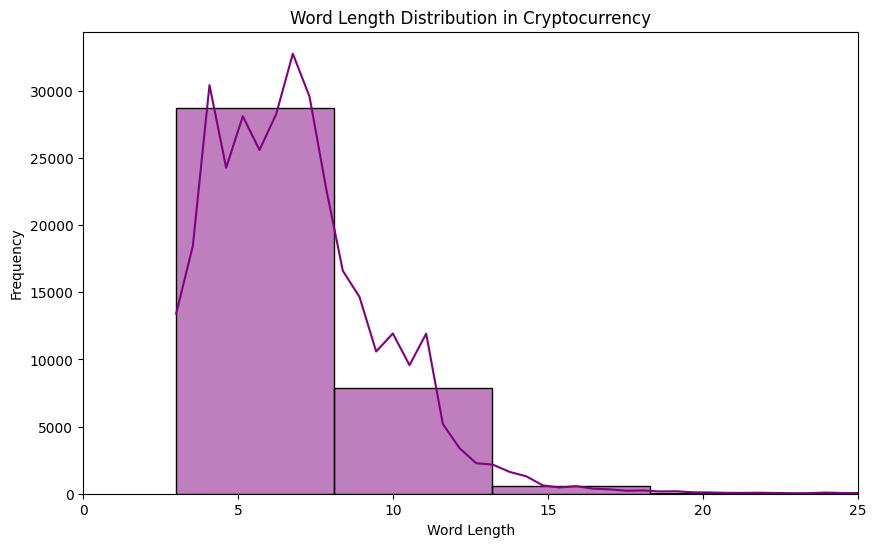

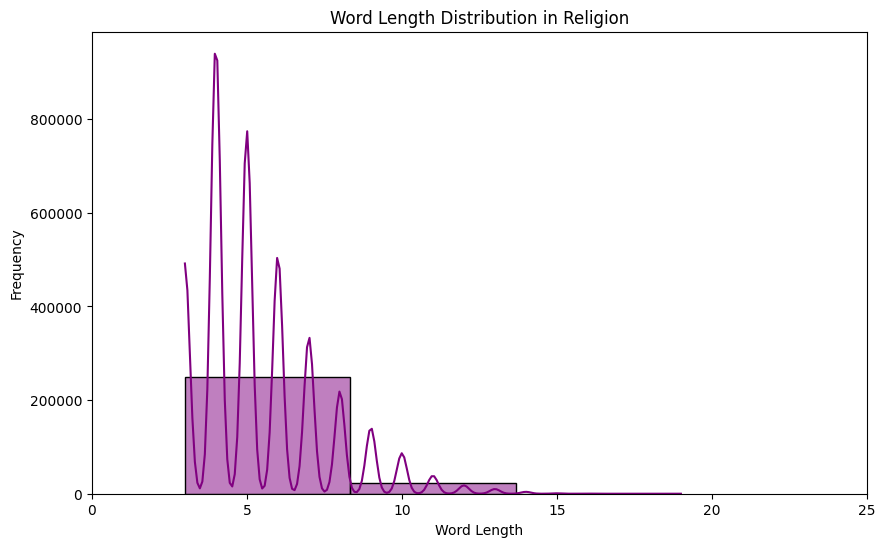

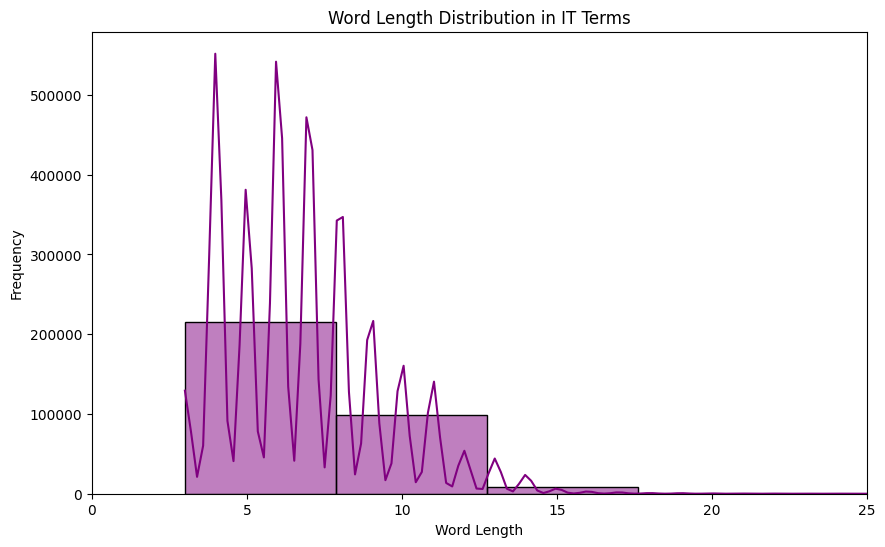

In [ ]:
#Plotting the word length for Business
plot_word_length_distribution(business_words, 'Business')
#Plotting the word length for Law
plot_word_length_distribution(law_words, 'Law')
#Plotting the word length for Medical
plot_word_length_distribution(medical_words, 'Medical')
#Plotting the word length for politics
plot_word_length_distribution(politics_words, 'Politics')
#Plotting the word length for Real Estate
plot_word_length_distribution(realestate_words, 'Real Estate')
#Plotting the word length for Crypto
plot_word_length_distribution(crypto_words, 'Cryptocurrency')
#Plotting the word length for Religion
plot_word_length_distribution(religion_words, 'Religion')
#Plotting the word length for IT
plot_word_length_distribution(it_words, 'IT Terms')

Evaluating the vocabulary distributions

In [ ]:
# Creating a function to estimate vocabulary diversity
def calculate_vocabulary_diversity(words):
    unique_words = len(set(words))
    total_words = len(words)
    diversity_ratio = unique_words / total_words
    return diversity_ratio, unique_words, total_words

# Calculate and print vocabulary diversity for each category
for category, words in [("Business", business_words),
                        ("Law", law_words),
                        ("Real Estate", realestate_words),
                        ("IT Terms", it_words),
                        ("Medical", medical_words),
                        ("Politics", politics_words),
                        ("Cryptocurrency", crypto_words),
                        ("Religion", religion_words)]:

    diversity_ratio, unique_words, total_words = calculate_vocabulary_diversity(words)
    print(f"{category} Vocabulary Diversity:")
    print(f"  - Total Words: {total_words}")
    print(f"  - Unique Words: {unique_words}")
    print(f"  - Diversity Ratio: {diversity_ratio:.4f}\n")

Business Vocabulary Diversity:
  - Total Words: 52261
  - Unique Words: 6599
  - Diversity Ratio: 0.1263

Law Vocabulary Diversity:
  - Total Words: 118243
  - Unique Words: 15030
  - Diversity Ratio: 0.1271

Real Estate Vocabulary Diversity:
  - Total Words: 2631
  - Unique Words: 973
  - Diversity Ratio: 0.3698

IT Terms Vocabulary Diversity:
  - Total Words: 322788
  - Unique Words: 11876
  - Diversity Ratio: 0.0368

Medical Vocabulary Diversity:
  - Total Words: 424865
  - Unique Words: 31150
  - Diversity Ratio: 0.0733

Politics Vocabulary Diversity:
  - Total Words: 58724
  - Unique Words: 5829
  - Diversity Ratio: 0.0993

Cryptocurrency Vocabulary Diversity:
  - Total Words: 37373
  - Unique Words: 5636
  - Diversity Ratio: 0.1508

Religion Vocabulary Diversity:
  - Total Words: 273062
  - Unique Words: 13154
  - Diversity Ratio: 0.0482



Representing the result in a bar chat for vocabulary diversity across domains.




/tmp/ipython-input-53-3040169826.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categories, y=[ratio * 100 for ratio in diversity_ratios], palette="viridis")


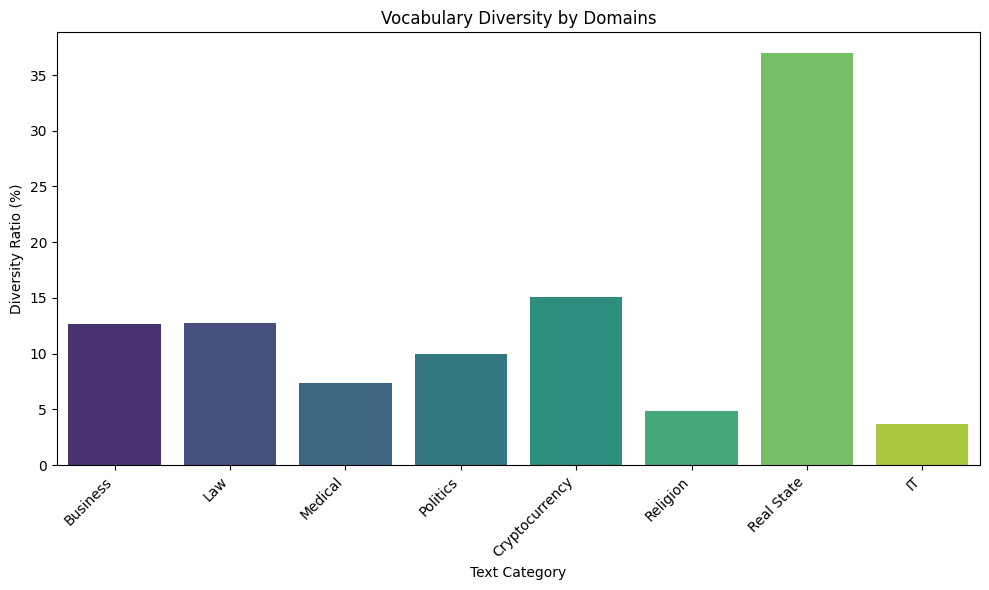

In [ ]:
## Vocabulary diversity visualisation

# Function to calculate vocabulary diversity
def calculate_vocabulary_diversity(words):
    unique_words = len(set(words))
    total_words = len(words)
    diversity_ratio = unique_words / total_words
    return diversity_ratio, unique_words, total_words

# Data preparation
categories = ["Business",
              "Law",
              "Medical",
              "Politics",
              "Cryptocurrency",
              "Religion",
              "Real State",
              "IT"]
diversity_ratios = []
unique_words_list = []
total_words_list = []

for category, words in zip(categories,
                            [business_words,
                             law_words,
                             medical_words,
                             politics_words,
                             crypto_words,
                             religion_words,
                             realestate_words,
                             it_words]):

    diversity_ratio, unique_words, total_words = calculate_vocabulary_diversity(words)
    diversity_ratios.append(diversity_ratio)
    unique_words_list.append(unique_words)
    total_words_list.append(total_words)

# Visualization using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=categories, y=[ratio * 100 for ratio in diversity_ratios], palette="viridis")
plt.title('Vocabulary Diversity by Domains')
plt.xlabel('Text Category')
plt.ylabel('Diversity Ratio (%)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

### N-gram analysis

In [ ]:
from nltk import ngrams
from nltk.probability import FreqDist

nltk.download('punkt')

# Function to generate and plot n-grams
def plot_ngrams(words, n, category):
    # Generate n-grams
    n_grams = ngrams(words, n)
    # Calculate frequency distribution of n-grams
    freq_dist = FreqDist(n_grams)

    # Convert to DataFrame for easier plotting
    ngram_freq_df = pd.DataFrame(freq_dist.items(), columns=['N-gram', 'Frequency'])
    ngram_freq_df['N-gram'] = ngram_freq_df['N-gram'].apply(lambda x: ' '.join(x))  # Convert tuples to strings
    ngram_freq_df = ngram_freq_df.sort_values(by='Frequency', ascending=False).head(20)

    # Plotting the n-gram frequency distribution
    plt.figure(figsize=(5, 5))
    sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')
    plt.title(f'Top 20 {n}-gram Frequency Distribution in {category}')
    plt.xlabel('Frequency')
    plt.ylabel('N-gram')
    plt.show()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Top  Bigrams for Business:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


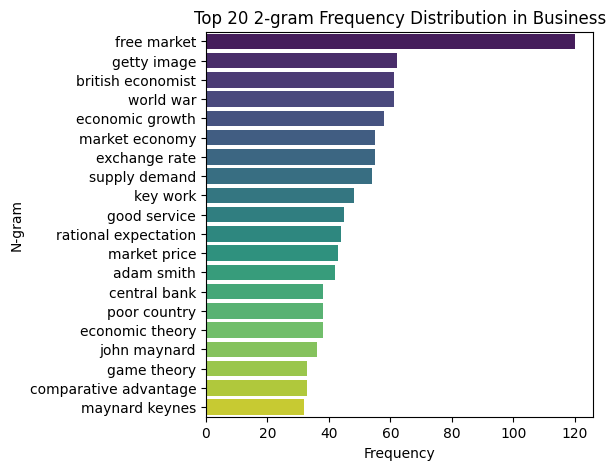

Top  Trigrams for Business:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


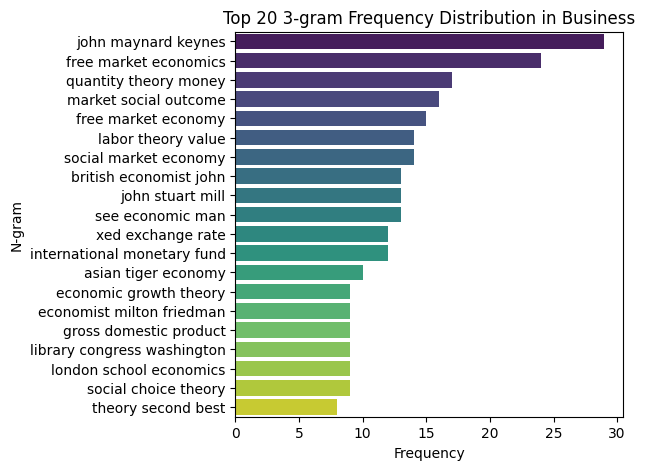

Top  Bigrams for Law:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


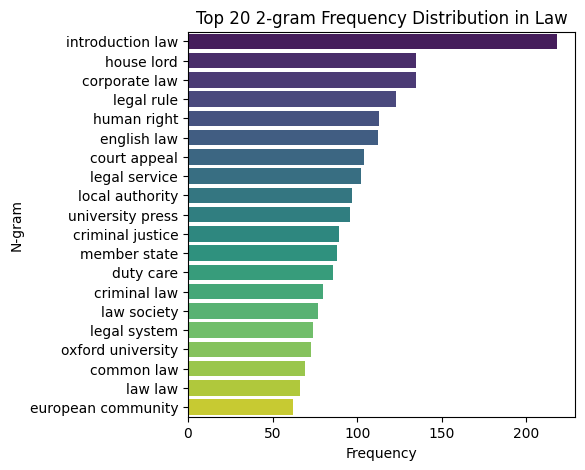

Top  Trigrams for Law:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


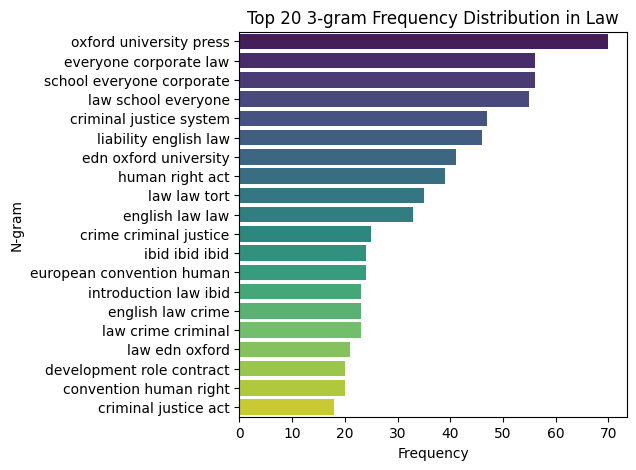

Top  Bigrams for Medical:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


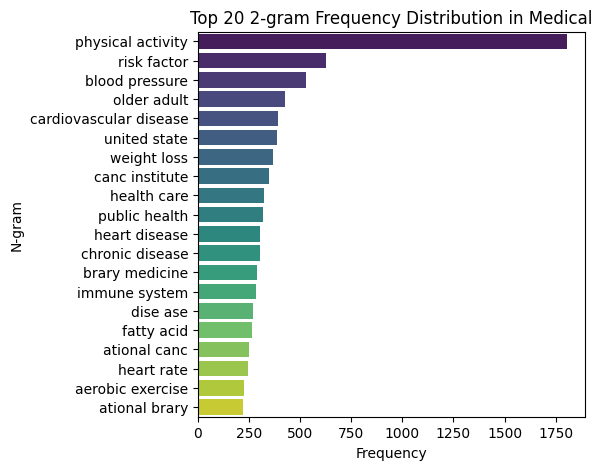

Top  Trigrams for Medical:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


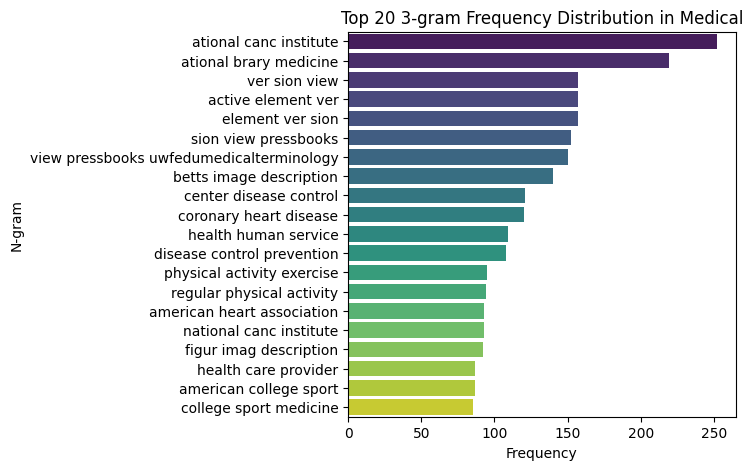

Top  Bigrams for Politics:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


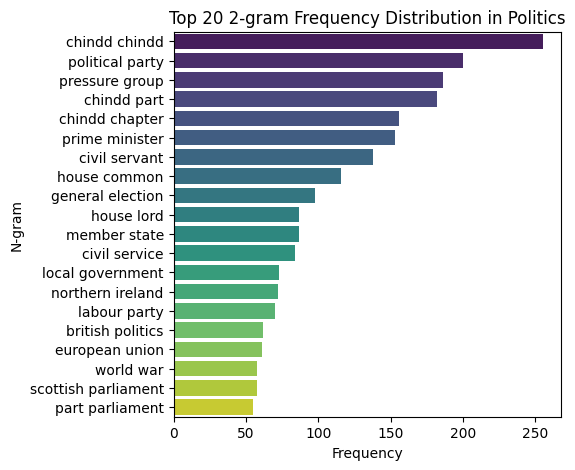

Top  Trigrams for Politics:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


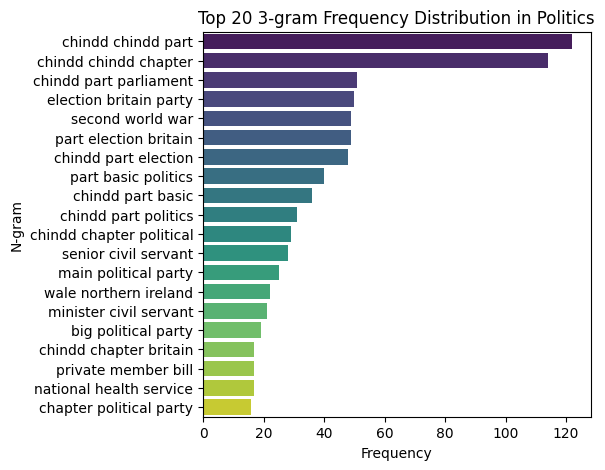

Top  Bigrams for Cryptocurrency:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


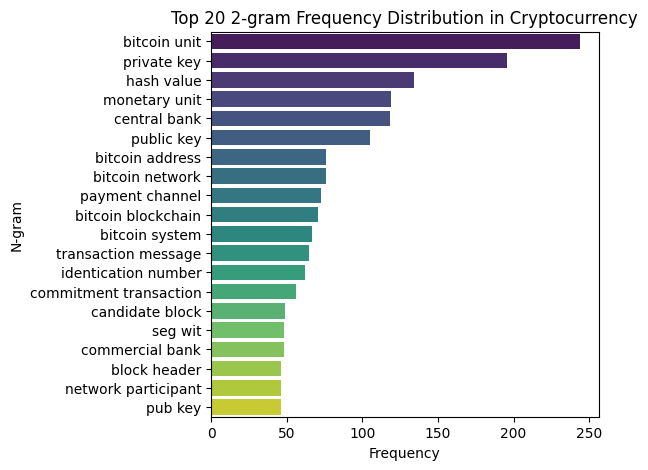

Top  Trigrams for Cryptocurrency:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


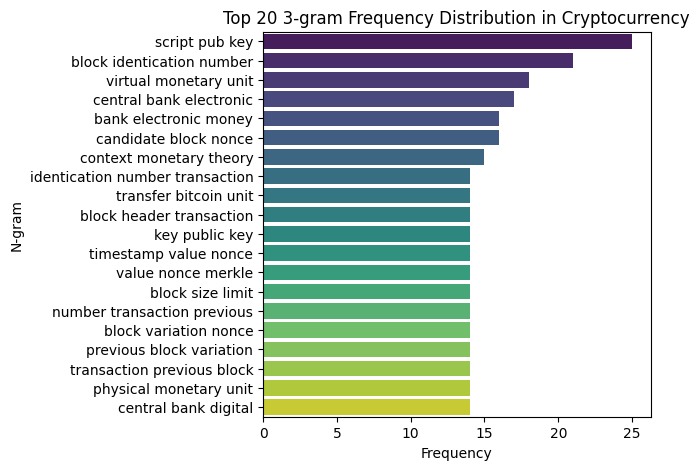

Top  Bigrams for IT Terms:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


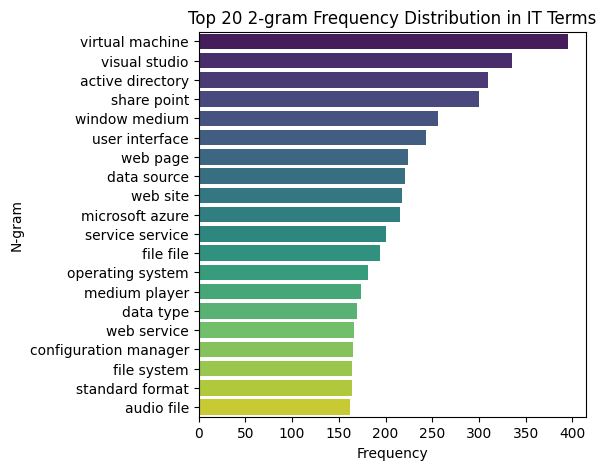

Top  Trigrams for IT Terms:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


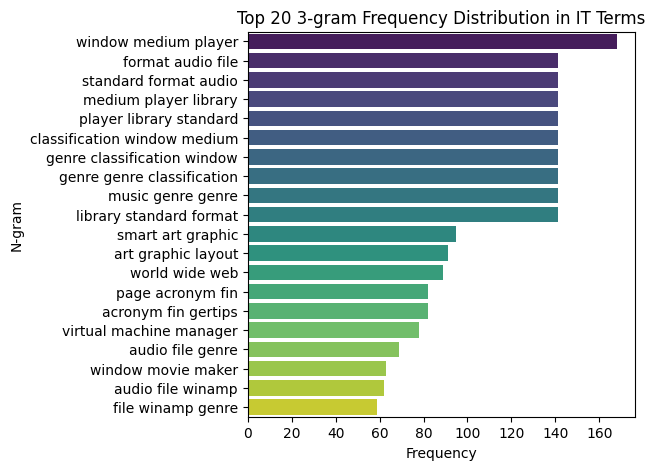

Top  Bigrams for Religion:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


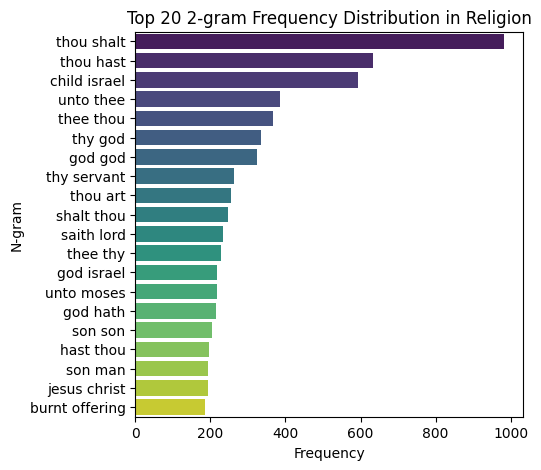

Top  Trigrams for Religion:


/tmp/ipython-input-54-2230945633.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='N-gram', data=ngram_freq_df, palette='viridis')


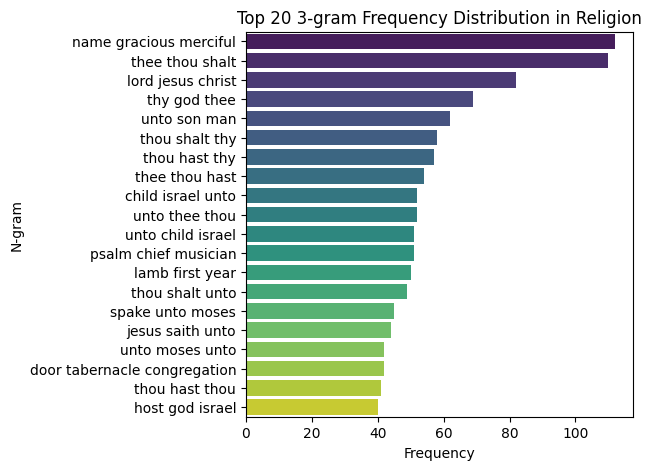

In [ ]:
# Bigrams and trigrams
for category, words in [("Business", business_words),
                        ("Law", law_words),
                        ("Medical", medical_words),
                        ("Politics", politics_words),
                        ("Cryptocurrency", crypto_words),
                        #("Real Estate", realestate_words),
                        ("IT Terms", it_words),
                        ("Religion", religion_words)]:

    print(f"Top  Bigrams for {category}:")
    plot_ngrams(words, 2, category)
    print(f"Top  Trigrams for {category}:")
    plot_ngrams(words, 3, category)

## TRAINING THE LDA MODELS

In [ ]:
#Loading the libraries
from gensim import corpora, models
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

### Reduced documents and clusters

In [ ]:
# Combining all documents into a single list (dictionary)
# Let's start only with 3...
documents =[
            #business_words,
            #law_words,
            politics_words,
            #crypto_words,
            medical_words,
            religion_words,
            #realestate_words,
            #it_words
            ]

# Creating a dictionary and corpus
dictionary = corpora.Dictionary(documents)
corpus = [dictionary.doc2bow(doc) for doc in documents]

In [ ]:
n_topics = 3  # Number of topics to be extracted, may be more or  less than the original!

# Train the LDA model with parameter tuning
lda_model = models.LdaModel(
    corpus=corpus,              # The corpus containing documents
    num_topics=n_topics,        # Specifying the number of topics
    id2word=dictionary,         # Dictionary mapping word IDs to words
    passes=24,                  # Number of passes through the corpus
    iterations=100,             # Number of iterations per pass
    alpha=0.01,                 # Smaller alpha for distinct topics
    eta=0.01,
    random_state=0,
    minimum_probability=0.000001,
    per_word_topics=True
)

In [ ]:
# Save the model and the dictionary
#lda_model.save('/content/drive/MyDrive/LDA/lda_model_3-3.model')
#dictionary.save('/content/drive/MyDrive/LDA/lda_dictionary_3-3.dict')

In [ ]:
# Getting the topics directly
def generate_topic_mapping(lda_model, num_words=10):
    topic_mapping = {}
    for idx, topic in lda_model.print_topics():
        words = [word for word, _ in lda_model.show_topic(idx, num_words)]
        topic_mapping[f"Topic_{idx}"] = words
    return topic_mapping

topic_mapping = generate_topic_mapping(lda_model)

#Saving to JSON file
# with open('/content/drive/MyDrive/LDA/topic_mapping_generated_4-4.json', 'w') as f:
#    json.dump(topic_mapping, f, indent=4)

print("Topic mapping generated successfully.")

Topic mapping generated successfully.


In [ ]:
# Inspect the topics
topic_words = lda_model.print_topics(num_topics=len(documents))

# Print topics for inspection
for idx, topic in topic_words:
    print(f"Topic {idx}: {topic}")

Topic 0: 0.020*"party" + 0.014*"government" + 0.010*"chindd" + 0.009*"election" + 0.009*"political" + 0.009*"parliament" + 0.008*"member" + 0.008*"minister" + 0.008*"people" + 0.007*"vote"
Topic 1: 0.009*"health" + 0.008*"exercise" + 0.007*"activity" + 0.007*"risk" + 0.007*"study" + 0.006*"physical" + 0.006*"disease" + 0.005*"blood" + 0.005*"food" + 0.004*"individual"
Topic 2: 0.026*"unto" + 0.024*"god" + 0.018*"thou" + 0.016*"thy" + 0.013*"son" + 0.013*"thee" + 0.011*"day" + 0.010*"man" + 0.010*"people" + 0.009*"israel"


In [ ]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

lda_vis = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.save_html(lda_vis, '/content/drive/MyDrive/LDA/lda_visualisation_3-3.html')

# Visualize the topics
pyLDAvis.enable_notebook()
vis_data = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(vis_data)

### All documents and reduced clusters

In [ ]:
# Combining all documents into a single list
documents =[
            business_words,
            law_words,
            politics_words,
            crypto_words,
            medical_words,
            religion_words,
            realestate_words,
            it_words
            ]

# Creating a dictionary and corpus
dictionary = corpora.Dictionary(documents)
corpus = [dictionary.doc2bow(doc) for doc in documents]

In [ ]:
n_topics = 4  # Number of topics to be extracted

# Train the LDA model with parameter tuning
lda_model = models.LdaModel(
    corpus=corpus,              # The corpus containing documents
    num_topics=n_topics,        # Specifying the number of topics
    id2word=dictionary,         # Dictionary mapping word IDs to words
    passes=24,                  # Number of passes through the corpus
    iterations=100,             # Number of iterations per pass
    alpha=0.01,                 # Smaller alpha for distinct topics
    eta=0.01,
    random_state=0,
    minimum_probability=0.000001,
    per_word_topics=True
)

In [ ]:
# Save the model and the dictionary
#lda_model.save('/content/drive/MyDrive/LDA/lda_model_8-4.model')
#dictionary.save('/content/drive/MyDrive/LDA/lda_dictionary_8-4.dict')

In [ ]:
# Getting the topics directly
def generate_topic_mapping(lda_model, num_words=10):
    topic_mapping = {}
    for idx, topic in lda_model.print_topics():
        words = [word for word, _ in lda_model.show_topic(idx, num_words)]
        topic_mapping[f"Topic_{idx}"] = words
    return topic_mapping

topic_mapping = generate_topic_mapping(lda_model)

#Saving to JSON file
#with open('/content/drive/MyDrive/LDA/topic_mapping_generated_8-4.json', 'w') as f:
#    json.dump(topic_mapping, f, indent=4)

print("Topic mapping generated successfully.")

Topic mapping generated successfully.


In [ ]:
# Inspect the topics
topic_words = lda_model.print_topics(num_topics=len(documents))

# Print topics for inspection
for idx, topic in topic_words:
    print(f"Topic {idx}: {topic}")

Topic 0: 0.009*"health" + 0.008*"exercise" + 0.007*"activity" + 0.007*"risk" + 0.007*"study" + 0.006*"physical" + 0.006*"disease" + 0.005*"food" + 0.005*"blood" + 0.005*"individual"
Topic 1: 0.000*"data" + 0.000*"god" + 0.000*"health" + 0.000*"unto" + 0.000*"thou" + 0.000*"system" + 0.000*"activity" + 0.000*"time" + 0.000*"study" + 0.000*"thy"
Topic 2: 0.012*"data" + 0.011*"service" + 0.011*"user" + 0.009*"system" + 0.008*"window" + 0.008*"file" + 0.008*"application" + 0.007*"computer" + 0.007*"server" + 0.007*"information"
Topic 3: 0.015*"unto" + 0.014*"god" + 0.011*"thou" + 0.009*"thy" + 0.008*"people" + 0.008*"law" + 0.008*"son" + 0.007*"thee" + 0.007*"day" + 0.006*"man"


In [ ]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

lda_vis = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.save_html(lda_vis, '/content/drive/MyDrive/LDA/lda_visualisation_8-4.html')

# Visualize the topics
pyLDAvis.enable_notebook()
vis_data = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(vis_data)

### All documents and clusters

In [ ]:
# Combining all documents into a single list
documents =[
            business_words,
            law_words,
            politics_words,
            crypto_words,
            medical_words,
            religion_words,
            realestate_words,
            it_words
            ]

# Creating a dictionary and corpus
dictionary = corpora.Dictionary(documents)
corpus = [dictionary.doc2bow(doc) for doc in documents]

In [ ]:
n_topics = 8  # Number of topics to be extracted

# Train the LDA model with parameter tuning
lda_model = models.LdaModel(
    corpus=corpus,              # The corpus containing documents
    num_topics=n_topics,        # Specifying the number of topics
    id2word=dictionary,         # Dictionary mapping word IDs to words
    passes=24,                  # Number of passes through the corpus
    iterations=100,             # Number of iterations per pass
    alpha=0.01,                 # Smaller alpha for distinct topics
    eta=0.01,
    random_state=0,
    minimum_probability=0.000001,
    per_word_topics=True
)

In [ ]:
# Save the model and the dictionary
#lda_model.save('/content/drive/MyDrive/LDA/lda_model_8-8.model')
#dictionary.save('/content/drive/MyDrive/LDA/lda_dictionary_8-8.dict')

In [ ]:
# Getting the topics directly
def generate_topic_mapping(lda_model, num_words=10):
    topic_mapping = {}
    for idx, topic in lda_model.print_topics():
        words = [word for word, _ in lda_model.show_topic(idx, num_words)]
        topic_mapping[f"Topic_{idx}"] = words
    return topic_mapping

topic_mapping = generate_topic_mapping(lda_model)

#Saving to JSON file
#with open('/content/drive/MyDrive/LDA/topic_mapping_generated_8-8.json', 'w') as f:
#    json.dump(topic_mapping, f, indent=4)

print("Topic mapping generated successfully.")

Topic mapping generated successfully.


In [ ]:
# Inspect the topics
topic_words = lda_model.print_topics(num_topics=len(documents))

# Print topics for inspection
for idx, topic in topic_words:
    print(f"Topic {idx}: {topic}")

Topic 0: 0.017*"law" + 0.010*"court" + 0.009*"case" + 0.009*"party" + 0.007*"legal" + 0.007*"act" + 0.007*"government" + 0.005*"state" + 0.004*"political" + 0.004*"right"
Topic 1: 0.001*"health" + 0.001*"risk" + 0.000*"activity" + 0.000*"study" + 0.000*"exercise" + 0.000*"disease" + 0.000*"physical" + 0.000*"system" + 0.000*"blood" + 0.000*"year"
Topic 2: 0.013*"data" + 0.012*"user" + 0.012*"service" + 0.010*"window" + 0.010*"file" + 0.009*"system" + 0.009*"computer" + 0.008*"application" + 0.008*"server" + 0.007*"information"
Topic 3: 0.001*"user" + 0.001*"system" + 0.001*"data" + 0.001*"service" + 0.000*"window" + 0.000*"application" + 0.000*"information" + 0.000*"file" + 0.000*"server" + 0.000*"type"
Topic 4: 0.026*"unto" + 0.024*"god" + 0.018*"thou" + 0.016*"thy" + 0.013*"son" + 0.013*"thee" + 0.011*"day" + 0.010*"man" + 0.010*"people" + 0.009*"israel"
Topic 5: 0.016*"market" + 0.013*"economy" + 0.013*"economist" + 0.012*"price" + 0.011*"economic" + 0.008*"economics" + 0.007*"peopl

In [ ]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

lda_vis = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.save_html(lda_vis, '/content/drive/MyDrive/LDA/lda_visualisation_8-8.html')

# Visualize the topics
pyLDAvis.enable_notebook()
vis_data = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(vis_data)

## TESTING THE LDA MODEL

### Checkpoint 2: Load Model and Dictionary

In [ ]:
#Load the LDA model and dictionary
#from gensim import corpora, models
#lda_model = models.LdaModel.load('/content/drive/MyDrive/LDA/lda_model_8-8.model')
#dictionary = corpora.Dictionary.load('/content/drive/MyDrive/LDA/lda_dictionary_8-8.dict')

### LDA MODEL TEST 1: Using a text string

New Document:
  Original Text: Messiah is Lord of heaven.
  Topic Distribution:
    Unknown: 0.0033
    Unknown: 0.0033
    Unknown: 0.0033
    Unknown: 0.0033
    Unknown: 0.9772
    Unknown: 0.0033
    Unknown: 0.0033
    Unknown: 0.0033


<ipython-input-71-ac96f006d067>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_labels, y=topic_probs, palette="viridis")


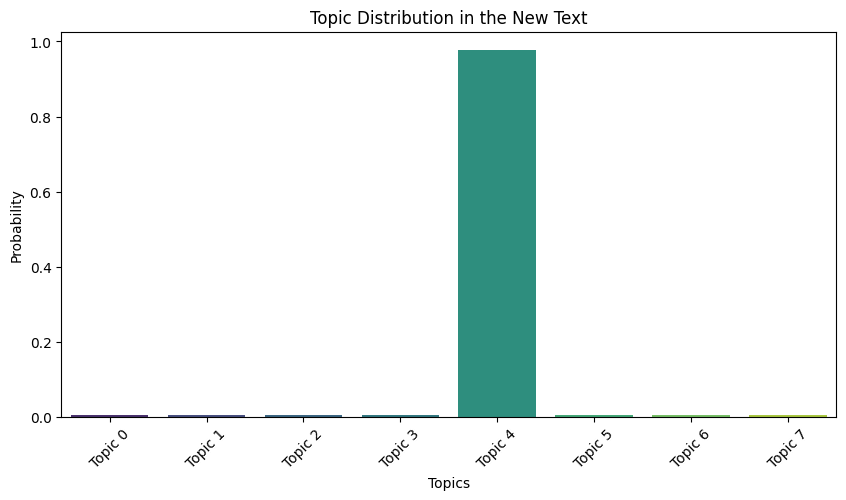

In [ ]:
import json
import numpy as np # Import numpy for type conversion

topics_json = {}
for topic_id, topic in lda_model.show_topics(formatted=False, num_words=5):
    topic_words = {word: float(prob) for word, prob in topic} # Convert prob to Python float
    topics_json[f"Topic {topic_id}"] = topic_words

# Convert to JSON format
topics_json_str = json.dumps(topics_json, indent=4)

# Save to a JSON file or use as needed
with open('lda_topics.json', 'w') as f:
    f.write(topics_json_str)

# print(topics_json_str)

# sample text documents to test the LDA model
new_text = "Messiah is Lord of heaven."

# Preprocess the new document
new_text_preprocessed = preprocess_text(new_text)

# Convert the new document to a bag-of-words representation using the existing dictionary
new_corpus = dictionary.doc2bow(new_text_preprocessed)

# Infer the topic distribution for the new document
new_topics = lda_model.get_document_topics(new_corpus)

# Print the topic distribution for the new document with labeled topics
print("New Document:")
print(f"  Original Text: {new_text}")
print("  Topic Distribution:")
for topic_id, prob in new_topics:
    topic_name = topic_mapping.get(str(topic_id), "Unknown")
    print(f"    {topic_name}: {prob:.4f}")

# VisualiSe the topic distribution
topic_probs = [prob for _, prob in new_topics]
topic_labels = [topic_mapping.get(str(topic_id), f"Topic {topic_id}") for topic_id, _ in new_topics]

plt.figure(figsize=(10, 5))
sns.barplot(x=topic_labels, y=topic_probs, palette="viridis")
plt.xlabel('Topics')
plt.ylabel('Probability')
plt.title('Topic Distribution in the New Text')
plt.xticks(rotation=45)
plt.show()

### LDA MODEL TEST 2: Using a pdf document

  Topic Distribution:
 Original Text: Consumption of dietary fibre, fruits and vegetables, and fish, is
associated with greater food biodiversity in UK diets
Magaly
 Aceves-Martins
1
; 
Anneli
 Löfstedt
1
; 
Carlos Francisco
 Moreno-García
2
;
Mariska
 Dötsch-Klerk
3
; 
Elizabeth
 Zandstra
3
; 
Anne
 Wanders
3
; 
Baukje
 De Roos
1
1
The Rowett Institute
, 
University of Aberdeen
, 
Aberdeen
, 
United Kingdom
; 
2
School of
Computing
, 
Robert Gordon University
, 
Aberdeen
, 
United Kingdom
; 
3
Diet and Health
, 
Unilever
Foods Innovation Centre - Hive
, 
Wageningen
, 
Netherlands
Background and objectives
Dietary species richness (DSR), a metric of food diversity, has been inversely
associated with total and cause-specific mortality in European populations. We
determined whether i) DSR can be robustly measured based on four-day food
intake data, ii) DSR is associated with diet quality, and iii) DSR is dependent on
socio-demographic characteristics. 
Methods
The NDNS nutrient databank 

<ipython-input-72-eeb748e696dd>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_labels, y=topic_probs, palette="viridis")


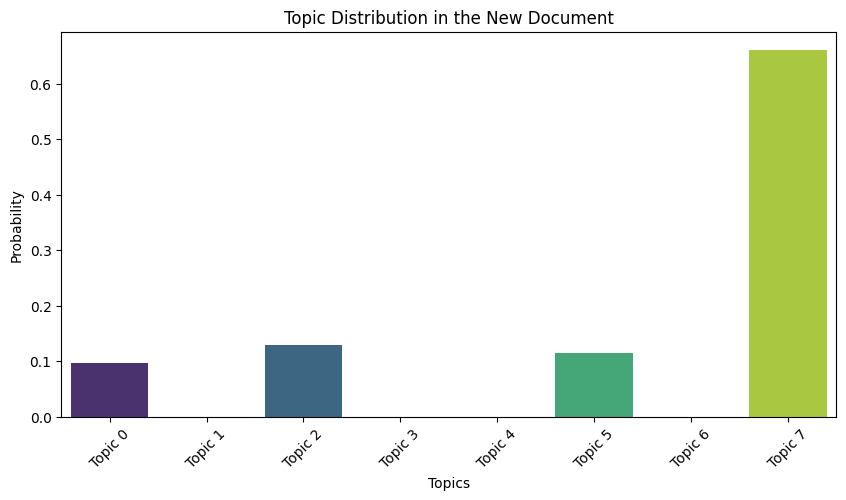

In [ ]:
# Load the document
new_document = extract_text_from_pdf('/content/drive//MyDrive/LDA/test.pdf')

# Preprocess the new document
new_document_preprocessed = preprocess_text(new_document)

# Convert the new document to a bag-of-words representation using the existing dictionary
new_corpus = dictionary.doc2bow(new_document_preprocessed)

# Infer the topic distribution for the new document
new_topics = lda_model.get_document_topics(new_corpus)

# Print the topic distribution for the new document with labeled topics
print("  Topic Distribution:")
print(f" Original Text: {new_document}")
for topic_id, prob in new_topics:
    topic_name = topic_mapping.get(str(topic_id), "Unknown")
    print(f"    {topic_name}: {prob:.4f}")

# Visualize the topic distribution
topic_probs = [prob for _, prob in new_topics]
topic_labels = [topic_mapping.get(str(topic_id), f"Topic {topic_id}") for topic_id, _ in new_topics]

plt.figure(figsize=(10, 5))
sns.barplot(x=topic_labels, y=topic_probs, palette="viridis")
plt.xlabel('Topics')
plt.ylabel('Probability')
plt.title('Topic Distribution in the New Document')
plt.xticks(rotation=45)
plt.show()

### LDA MODEL TEST 3: Using a textbox

In [ ]:
# Import necessary libraries
import ipywidgets as widgets
from IPython.display import display
from gensim.corpora.dictionary import Dictionary
from gensim.models import LdaModel
import numpy as np


# Text input widget for entering text
text_input = widgets.Textarea(
    placeholder='Enter your text here...',
    description='Input Text:',
    layout=widgets.Layout(width='50%', height='100px')
)

# Button to trigger LDA prediction
predict_button = widgets.Button(
    description="Predict Domain",
    button_style='primary'
)

# Output widget to display the prediction
output = widgets.Output()

# Define function to predict domain using the LDA model
def predict_domain(text):
    # Preprocess the text input to match  model's preprocessing
    bow = dictionary.doc2bow(text.lower().split())

    # Get topic distribution for the input text
    topic_distribution = lda_model.get_document_topics(bow)

    # Find the topic with the highest probability
    topic_id, topic_prob = max(topic_distribution, key=lambda x: x[1])

    # Display the result
    output.clear_output()
    with output:
        print(f"Predicted Domain is related to : Topic {topic_id} with probability {topic_prob:.2f}")
        print("Domain keywords:", lda_model.print_topic(topic_id, topn=5))

# Button click event to trigger prediction
def on_predict_button_clicked(b):
    text = text_input.value
    if text.strip():
        predict_domain(text)
    else:
        output.clear_output()
        with output:
            print("Please enter some text.")

# Set up button click event
predict_button.on_click(on_predict_button_clicked)

# Display widgets and output
display(text_input, predict_button, output)


# THE END